<a href="https://colab.research.google.com/github/vsubra25/ML-Dog-Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to End Multi Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and Tensorflow Hub

## 1. Problem
Identifying breed of dog given an image.

## 2. Data
The dataset is from Kaggle's dog breed identification competition.

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some information about the data:
* We're dealing with images (unstructuerd) so its best we use deep learning/transfer learning.
* There are 120 breeds of dog (meaning there are 120 different classes)
* There are around 10,000+ imaged in training and test set.
* The training set has labels
* The test set has no labels (This is what we're prediction on)

### Get our Workspace ready
* Import latest TensorFlow ✅
* Import TensorFlow Hub ✅
* Make sure we are using GPU ✅

In [ ]:
# Import Tensorflow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF version', tf.__version__)
print('TF version', hub.__version__)

# check for GPU availability
print('GPU','Success!!' if tf.config.list_physical_devices('GPU') else 'not available')

TF version 2.8.2
TF version 0.12.0
GPU Success!!


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical representation. Turning our images into Tensors.

Let's start by accessing our data nad checking out the labels.

In [ ]:
import pandas as pd

labels_csv=pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


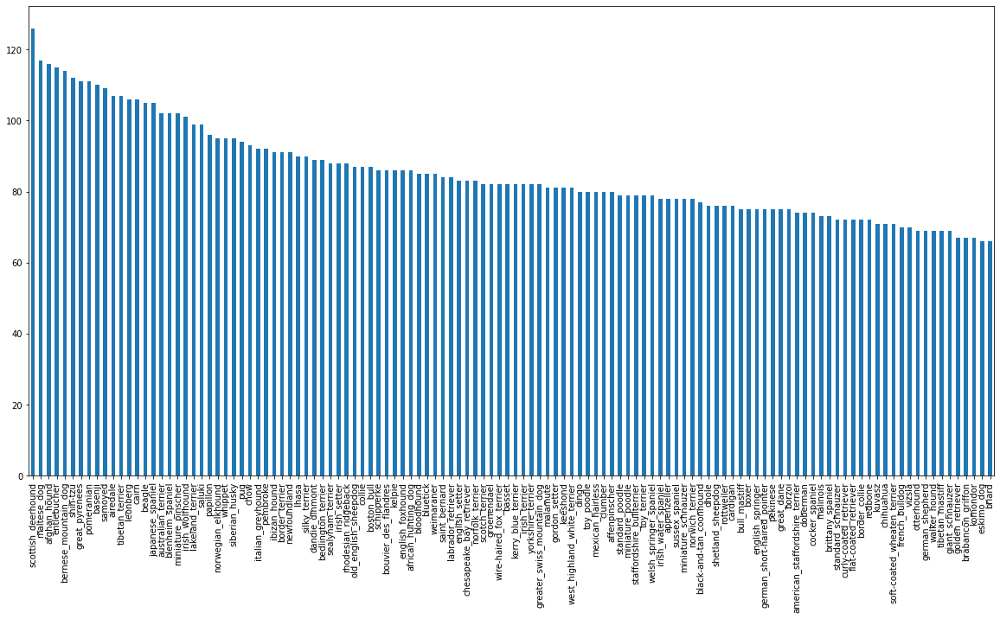

In [ ]:
# How many iamges are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

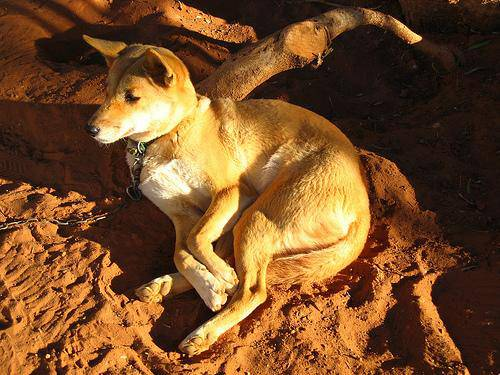

In [ ]:
#let's view an image
from IPython.display import Image
Image('drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their lables
Let's get a list of all out image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from image ID's
filenames=['drive/MyDrive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

#Check the first 10
filenames

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
#check whether number of filenames matches number of atual image files

import os
if len(os.listdir('drive/MyDrive/Dog Vision/train')) == len(filenames):
  print('Lengths are equal')
else:
  print('Not matched!')

Lengths are equal


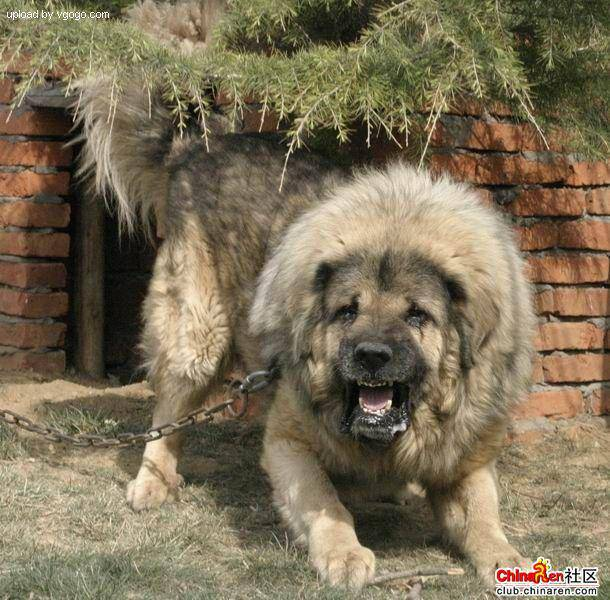

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

NameError: ignored

Since we've got our training image in a list, let's prepare our lables

In [ ]:
import numpy as np
labels=labels_csv['breed'].to_numpy()
# labels= np.array(labels) does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#See if number of lables matches the number of filenames
if(len(labels)== len(filenames)):
  print('labels Matched with filenames')
else:
  ('labels not matched with filenames')

labels Matched with filenames


In [ ]:
#Find unique label values
import numpy as np
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn a single label in to an array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#turn every label into a boolean array

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#Example Turining boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0] )) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since kaggle does not come with its own validation set,we're going to create our own

In [ ]:
#Setup X & y variables
X=filenames
y=boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off exerimentin with ~1000 images and increase as needed

In [ ]:
#Set number of images to use for experimenting
NUM_IMAGES=1000 #@param{type:"slider", min:1000,max:10000,step:1000}

In [ ]:
#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
#Let's have a look at the training data
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into Tensors)

To preproces our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensor
4. Normalize Color channels from 0-255 to 0-1
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`



In [ ]:
# Convert image to NumPy
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
# turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
#Define Image size
IMG_SIZE =224

# Create a function for preprocessing images

def process_image(image_path,img_size=IMG_SIZE):
  """
    Takes an image file path and turns the image into a Tensor
  """
  #Read in image file
  image= tf.io.read_file(image_path)
  #Turn the jpg into numerical Tensor with 3 color channels
  image=tf.image.decode_jpeg(image,channels=3)
  #Convert the color chnannel value to 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the ijmage to our desired value (224,224)
  image=tf.image.resize(image,size=(IMG_SIZE,IMG_SIZE))

  return image

#Turning our data into batches

Why turn our data into batches?

Training all 10,000+ images in one 'batch' is to much for memory to process.

That's why we  process 32 images at a time (can be adjusted manually). 32 is recommended.

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image,label)`

In [ ]:
# Create a function to return a tuple (image,label)

def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label, processes the image and 
  return a tuple of (image,label)
  """
  
  image=process_image(image_path,img_size=IMG_SIZE)
  return image,label

In [ ]:
#Demo of get_image_labels()
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuple of Tensors
in the form:`(image,label)`, let's make a function to turn all our data (x & y) into batches

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
#Create training and validation data batches
training_data= create_data_batches(X_train,y_train)
val_data= create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
training_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches,however, these can be a little har to comprehend,let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  #setup the figure
  plt.figure(figsize=(10,10))

  #loop through 25 
  for i in range(25):
    #Create subplots (5 rows, 5 cols)
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the gride lines off
    plt.axis('off')

In [ ]:
train_images, train_labels=next(training_data.as_numpy_iterator())

In [ ]:
train_images, train_labels

(array([[[[4.57251668e-02, 1.23097844e-01, 5.77529520e-02],
          [8.79704952e-02, 1.54556274e-01, 9.18651074e-02],
          [2.02626362e-02, 7.12115318e-02, 2.07364988e-02],
          ...,
          [3.70816976e-01, 3.32617104e-01, 2.57957399e-01],
          [2.91388363e-01, 2.63937384e-01, 2.01077998e-01],
          [1.07487209e-01, 9.31226462e-02, 4.30968516e-02]],
 
         [[6.83287382e-02, 1.42838553e-01, 6.50024116e-02],
          [9.70765799e-02, 1.63631871e-01, 9.30940434e-02],
          [1.11645527e-01, 1.61734864e-01, 1.04133300e-01],
          ...,
          [4.62985098e-01, 4.32670236e-01, 3.45494211e-01],
          [4.47188199e-01, 4.26352829e-01, 3.49031180e-01],
          [1.05561905e-01, 9.82076675e-02, 2.98559200e-02]],
 
         [[1.09366164e-01, 1.67874560e-01, 8.48913565e-02],
          [1.24054931e-01, 1.82248205e-01, 1.00297928e-01],
          [8.21717232e-02, 1.32518962e-01, 7.15449676e-02],
          ...,
          [3.96165013e-01, 3.69948357e-01, 2.6261

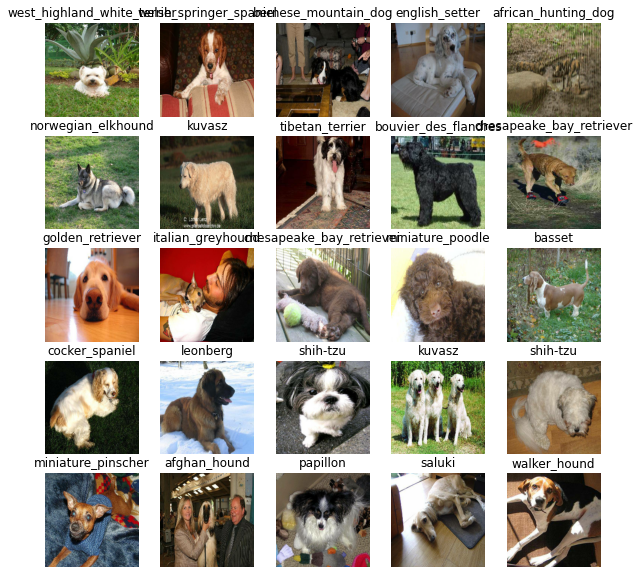

In [ ]:
# now lets visualize the data in a training batch
show_25_images(train_images, train_labels)

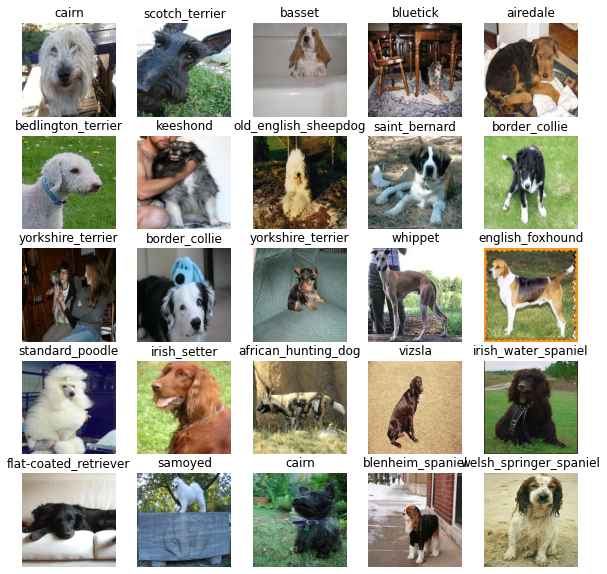

In [ ]:
# Lets visualize the validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few thing we need to define:

* The input shape (our images shape, in the form of Tensors) to our model
* The output shape(image labels, in the form of Tensors) of our model
* The URL of the model we want use

In [ ]:
#Setup input shape to the model

INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #batch, height,widht,color channel

#Setuup out shape of our model

OUTPUT_SHAPE = len(unique_breeds)

#Setip model URL from TensorFlow Hub
MODEL_URL= "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our inputs, outputs and modle ready to go. Let's put them together into a Kera deep learning model.

Kowning this,let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it shoul be evaluated and improved)
* Builds the mdoel (tells model the input shape it'll be getting)
* Returns the model

These steps can be found on tensorflow hub -> mobilenet

In [ ]:
# create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print('building model with:', MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation ='softmax') #LAyer 2 AKA dense layer (output shape)
                              ])
  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


**What Activation? What Loss?** 

Activation = Normalizing data

Loss- measure of how well the model is prediction(lower equals better)

Binary: activation-sigmoid, loss-binary crossentropy

Multi-Class: Actvation-softmax, Loss- Categorical Crossentropy

## Creating callbacks

Callback are helper functions a model can use during training to do succh things as save its progress, check its progress or stop trainin early if a model stops improving .

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping whihc prevents our model from training for too long.

### TensorBoard CallBack

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
#Load TensorBoard notebook extension
%load_ext tensorboard 


In [ ]:
import datetime
#create a function to build a TB callback
def create_tensorboard_callback():
  #create a log directory for storing tb logs
  logdir= os.path.join('drive/MyDrive/Dog Vision/logs',
                       #Make it so the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

(stop training when model stops improving to prevent overfitting so that model can perform on datasets it hasnt seen)

In [ ]:
# create early stopping callback
early_stopping =tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS= 100 #@{type:'slider',min:10, max:100,step:10}

In [ ]:
# chekc to make sure we're still running on GPU

print('GPU', 'available' if tf.config.list_logical_devices('GPU') else 'not available')

GPU available


Let's create a function which trains a model
- Create a model using create_model()
- Setup a TensorBoard callback using create_tensorboard_callback()
- Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
- Return the model

In [ ]:
# build a function to train and return a trained model

def train_model():
  """
  Trains a given model and returns a trained version
  """
  # create a model
  model=create_model()

  # Create new TB session everytime we train a model
  tb= create_tensorboard_callback()

  # Fit the model to the data passing it the callback
   
  model.fit(x=training_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tb, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# fit the model to the data 
model = train_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 137s 4s/step - loss: 4.4508 - accuracy: 0.0850 - val_loss: 3.5221 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 3s 123ms/step - loss: 1.5342 - accuracy: 0.7350 - val_loss: 2.2123 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 3s 124ms/step - loss: 0.5301 - accuracy: 0.9425 - val_loss: 1.7358 - val_accuracy: 0.5400
Epoch 4/100
25/25 [==============================] - 3s 121ms/step - loss: 0.2438 - accuracy: 0.9862 - val_loss: 1.5683 - val_accuracy: 0.5550
Epoch 5/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1414 - accuracy: 0.9962 - val_loss: 1.4668 - val_accuracy: 0.5900
Epoch 6/100
25/25 [==============================] - 4s 157ms/step - loss: 0.0982 - accuracy: 1.0000 - val_loss: 1.4303 - val_accuracy: 0.5950
Epoch 7/100
25/25 [==============================]

**Question**: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### checkin the TensorBoard logs

The TensorBoard magic function (`tensorboard`) will access the lgos directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to trained on)

predictions=model.predict(val_data,verbose=1)
predictions


7/7 [==============================] - 1s 105ms/step


array([[9.57684941e-04, 9.16081844e-05, 4.91442508e-04, ...,
        6.22347172e-04, 1.37591469e-05, 5.19434176e-03],
       [8.20938556e-04, 7.04519567e-04, 3.85784172e-03, ...,
        1.02821919e-04, 2.56037014e-03, 1.37104318e-04],
       [2.84800644e-05, 1.34945094e-05, 4.08380292e-04, ...,
        8.27960394e-05, 3.76758799e-05, 8.24189192e-05],
       ...,
       [2.00305431e-06, 5.25089090e-05, 1.06825086e-04, ...,
        9.21469473e-05, 5.83493274e-05, 2.00162031e-04],
       [1.39871603e-02, 4.68118349e-04, 9.40499944e-04, ...,
        1.08258311e-04, 1.18353317e-04, 7.93181825e-03],
       [8.12761311e-04, 3.79486373e-05, 2.59640743e-04, ...,
        5.59003139e-03, 3.29008588e-04, 3.19208411e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# first prediction
index=42
print(predictions[0])
print(f'Max value (probability of predictions): {np.max(predictions[0])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Maxindex: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')


[9.57684941e-04 9.16081844e-05 4.91442508e-04 1.19605917e-04
 1.28032872e-04 8.78808441e-06 2.66643651e-02 3.48009809e-04
 6.49252150e-04 3.74662282e-04 6.62907958e-04 2.76750186e-04
 1.25781924e-03 1.27153340e-04 4.35543625e-04 1.91755564e-04
 5.71013697e-05 8.96574259e-02 1.02692815e-04 9.66228035e-05
 3.58116376e-04 5.54565522e-05 4.67368845e-05 8.06212716e-04
 7.79899055e-05 1.50535733e-03 3.14624012e-01 1.51568878e-04
 3.79190606e-04 1.22819329e-04 1.42774472e-04 9.40120008e-05
 1.26242614e-03 1.67486251e-05 2.44736788e-04 3.75433452e-02
 5.75866579e-05 2.49043951e-04 5.08917838e-05 7.23047051e-05
 3.16883484e-03 5.30762663e-05 6.46950066e-05 1.34987218e-04
 5.13074228e-05 2.46779120e-04 2.69388693e-05 1.40414588e-04
 2.15202407e-03 4.86284771e-05 6.40082799e-05 4.63103243e-05
 2.27395052e-04 7.93448708e-05 7.84140502e-05 3.42186177e-05
 8.25073439e-05 2.24434608e-03 7.66573241e-04 1.41308188e-01
 1.84794728e-04 1.03096914e-04 1.51529210e-03 1.00782170e-04
 3.56281991e-04 1.827584


Having the above functionality is geat but we want to be able to do it at a scale_range

And it would even better if we could see the image the prediction is being made on! 

** NOTE:** Prediction probabilities are also known as confidence intervals

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]




In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# create a function to unbatch a dataset

def unbatchify( data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of 
  images and labels.
  """
  images=[]
  labels=[]

  #loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels
  
#Unbatchify the validation data
val_images,val_labels= unbatchify(val_data)
val_images[0],labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

* prediction labels
* validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. 

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

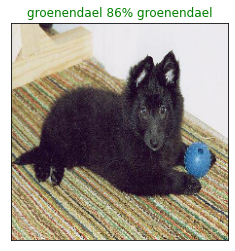

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our  models prediction, let's make another to view ur models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find  the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):

  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n/
  """
  
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label= get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
   # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 prediction labels
  top_10_pred_labels =unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass
                                         


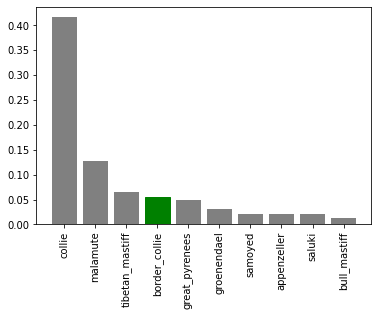

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

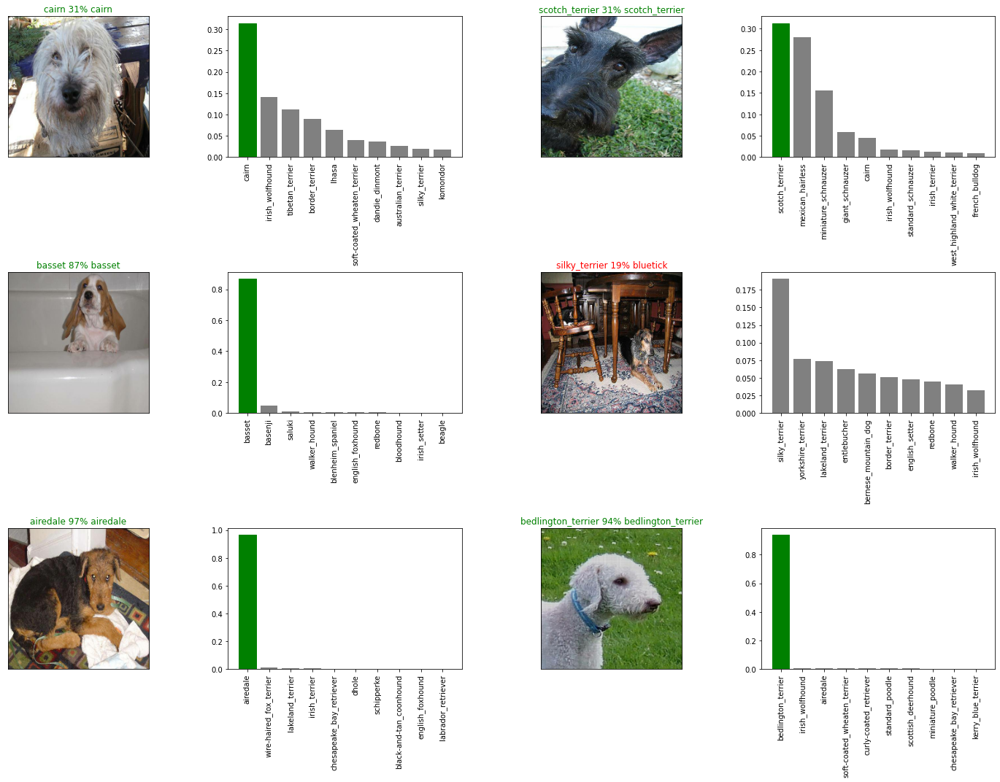

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier=0
num_rows= 3
num_cols=2
num_images=num_rows * num_cols
plt.figure(figsize =(10*num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (strin)
  """

  #create a model directory pathname with current time
  modeldir=os.path.join('drive/MyDrive/Dog Vision/models',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path=modeldir+ "_" + suffix + ".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model

def load_model(model_path):
  """
  loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix='1000_images_mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog Vision/models/20220628-03461656387978_1000_images_mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220628-03461656387978_1000_images_mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20220628-03461656387978_1000_images_mobilenetv2-Adam.h5')


Loading saved model from: drive/MyDrive/Dog Vision/models/20220628-03461656387978_1000_images_mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 137ms/step - loss: 1.3120 - accuracy: 0.6150


[1.311957597732544, 0.6150000095367432]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 127ms/step - loss: 1.3120 - accuracy: 0.6150


[1.311957597732544, 0.6150000095367432]

# Training a dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# create a data batch with the full data set
full_data=create_data_batches(X,y)


Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model for full model

full_model=create_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# fit the model on the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 43s 121ms/step - loss: 1.3597 - accuracy: 0.6630
Epoch 2/100
320/320 [==============================] - 41s 127ms/step - loss: 0.4097 - accuracy: 0.8761
Epoch 3/100
320/320 [==============================] - 43s 133ms/step - loss: 0.2385 - accuracy: 0.9335
Epoch 4/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1573 - accuracy: 0.9618
Epoch 5/100
320/320 [==============================] - 37s 117ms/step - loss: 0.1070 - accuracy: 0.9775
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0777 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0582 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0467 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 35s 108ms/step - loss: 0.0369 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 37s 115m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220628-04211656390070_full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220628-04211656390070_full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20220628-04211656390070_full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20220628-04211656390070_full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames
* Convert the filenmaes into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a prediction array by passing the test batches to the `predict()` method called on our model.


In [ ]:
#load test image filenames
import os
test_path= 'drive/MyDrive/Dog Vision/test/'
test_filenames=[test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]
                                                         


['drive/MyDrive/Dog Vision/test/ddfb44a70822741297344d0a9ea81f2d.jpg',
 'drive/MyDrive/Dog Vision/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 'drive/MyDrive/Dog Vision/test/e2686707ac5b5f75ce2ccbc906b624d8.jpg',
 'drive/MyDrive/Dog Vision/test/e6a0eeb3e82e14eb812d9ef22383ec11.jpg',
 'drive/MyDrive/Dog Vision/test/e4a6892fb0e5c0680edc17138089d93c.jpg',
 'drive/MyDrive/Dog Vision/test/deb66780609abfef7f5048df02149839.jpg',
 'drive/MyDrive/Dog Vision/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 'drive/MyDrive/Dog Vision/test/e218c0da622fedc975a97999ad7d48a5.jpg',
 'drive/MyDrive/Dog Vision/test/de9a61a532241cff14e732f43b646d9a.jpg',
 'drive/MyDrive/Dog Vision/test/de30e8d3cfd89cb021800007879f271b.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
#create test data batches
import tensorflow as tf
import tensorflow_hub as hub
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 1284s 4s/step


## Preparing test data set for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed. 

To get the data in this format:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add datato the ID column by extracting the test image ID's from their filepaths
* Add data ( the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to sbubmit it to Kaggle


In [ ]:
# Create a pandas DataFrame with empty columns
import pandas as pd
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to eac hdog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddfb44a70822741297344d0a9ea81f2d,1.025657e-12,2.704813e-04,7.134587e-12,4.565127e-15,2.350737e-08,7.366851e-08,2.523667e-11,2.485901e-08,7.191794e-06,...,5.526655e-13,6.095203e-10,1.983114e-11,2.687499e-07,5.604675e-11,1.472256e-10,6.403442e-04,4.842496e-09,6.706076e-07,3.528073e-16
1,e427b9e1ab1b7f09cfb02ac073f56f2d,8.724601e-10,1.666175e-09,5.059542e-11,5.731884e-09,7.439413e-13,1.516925e-13,3.815879e-08,2.436887e-11,1.175269e-13,...,1.052137e-12,3.255591e-10,2.547197e-13,2.401440e-08,4.247421e-13,1.202045e-10,6.153426e-09,8.826240e-12,9.998597e-01,1.585085e-09
2,e2686707ac5b5f75ce2ccbc906b624d8,7.054074e-09,6.373828e-11,1.480115e-10,9.053663e-11,1.302319e-09,4.040795e-14,6.243276e-08,1.458475e-07,2.218933e-11,...,5.081645e-05,2.522845e-07,3.093763e-10,3.177902e-07,7.431243e-09,3.084762e-08,4.797776e-03,2.361619e-10,1.081993e-07,1.488609e-01
3,e6a0eeb3e82e14eb812d9ef22383ec11,2.365097e-08,4.120361e-10,5.550730e-10,2.979660e-11,7.387885e-09,7.722288e-10,3.933945e-08,2.996660e-08,2.666228e-10,...,2.361577e-01,8.779911e-07,1.705345e-07,1.247479e-09,3.193703e-08,1.561496e-09,1.230374e-06,1.223612e-09,1.456811e-06,4.429501e-07
4,e4a6892fb0e5c0680edc17138089d93c,9.087990e-11,1.765349e-12,3.790870e-13,1.358194e-09,8.568257e-11,2.671939e-05,1.920784e-11,1.198874e-10,1.410152e-14,...,1.571376e-09,2.300453e-07,2.585674e-11,1.708511e-11,1.539538e-07,2.290667e-11,4.685287e-10,2.359257e-09,1.149041e-08,1.069968e-08


In [ ]:
#Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv', index=False)

# Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
*Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/dog1.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog2.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog3.jpg']

In [ ]:
# Turn custom phots into Data batches
custom_data= create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on the custome data
custom_preds= loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels



['labrador_retriever', 'german_shepherd', 'pembroke']

In [ ]:
# Get custom images (our unbatchify() function wont work since here arent labels.. maybe fix this late)
custom_images=[]

# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

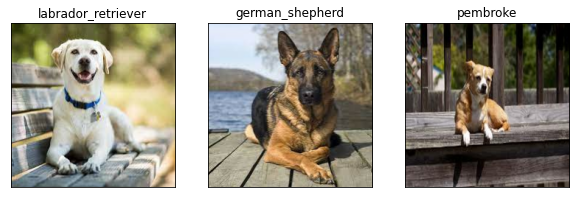

In [ ]:
# check custom image predictions
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)